In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal
from scipy.stats import chi2_contingency
import os

pd.set_option("display.max_rows", 100)
pd.set_option("display.max_columns", 40)

In [2]:
df = pd.read_csv('credit_score_dataset.csv', low_memory=False)

In [3]:
df.shape

(100000, 28)

In [4]:
# Removing samples with age < 18

df = df[df['Age'] >= 18]

In [5]:
df.shape

(94123, 28)

In [6]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",3,7.0,11.27,4.0,Good,809.98,26.822620,265,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",-1,7.0,11.27,4.0,Good,809.98,31.944960,266,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",3,7.0,11.27,4.0,Good,809.98,28.609352,267,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",5,4.0,6.27,4.0,Good,809.98,31.377862,268,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",6,4.0,11.27,4.0,Good,809.98,24.797347,269,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,Good


In [7]:
df.tail()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
99995,0x25fe9,CUS_0x942c,April,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"['Auto Loan', 'Student Loan']",23,7.0,11.5,3.0,Good,502.38,34.663572,378,No,35.104023,60.971333,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"['Auto Loan', 'Student Loan']",18,7.0,11.5,3.0,Good,502.38,40.565631,379,No,35.104023,54.185950,High_spent_Medium_value_payments,496.651610,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"['Auto Loan', 'Student Loan']",27,6.0,11.5,3.0,Good,502.38,41.255522,380,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"['Auto Loan', 'Student Loan']",20,6.0,11.5,3.0,Good,502.38,33.638208,381,No,35.104023,251.672582,Low_spent_Large_value_payments,319.164979,Standard
99999,0x25fed,CUS_0x942c,August,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"['Auto Loan', 'Student Loan']",18,6.0,11.5,3.0,Good,502.38,34.192463,382,No,35.104023,167.163865,Low_spent_Large_value_payments,393.673696,Poor


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,94123.0,34.416434,10.108802,18.000000,26.000000,34.000000,42.000000,56.000000
Annual_Income,94123.0,51259.962877,38742.406455,7006.035000,19602.220000,37618.300000,72841.320000,179987.280000
Monthly_Inhand_Salary,94123.0,4261.948766,3224.479873,303.645417,1647.642917,3136.036667,6072.140000,15204.633333
Num_Bank_Accounts,94123.0,5.282407,2.602250,0.000000,3.000000,5.000000,7.000000,11.000000
Num_Credit_Card,94123.0,5.478523,2.054767,0.000000,4.000000,5.000000,7.000000,11.000000
Interest_Rate,94123.0,14.186341,8.667050,1.000000,7.000000,12.000000,20.000000,34.000000
Num_of_Loan,94123.0,3.438660,2.426573,0.000000,2.000000,3.000000,5.000000,9.000000
Delay_from_due_date,94123.0,20.585564,14.682475,-5.000000,10.000000,17.000000,28.000000,67.000000
Num_of_Delayed_Payment,94123.0,13.115477,6.284408,0.000000,9.000000,13.000000,18.000000,28.000000
Changed_Credit_Limit,94123.0,10.200215,6.752570,-6.490000,5.130000,9.220000,14.430000,36.970000


In [9]:
df.describe(include=object).T

,count,unique,top,freq
ID,94123,94123,0x1602,1
Customer_ID,94123,11812,CUS_0xd40,8
Month,94123,8,August,11812
Name,94123,9701,Langep,48
SSN,94123,11812,821-00-0265,8
Occupation,94123,15,Lawyer,6707
Type_of_Loan,94123,5783,['No Loan'],11250
Credit_Mix,94123,3,Standard,42652
Payment_of_Min_Amount,94123,2,Yes,53555
Payment_Behaviour,94123,6,Low_spent_Small_value_payments,25711


In [6]:
mapping = {'Good': 2, 'Standard': 1, 'Poor': 0}
df['Credit_Score'] = df['Credit_Score'].map(mapping)

In [7]:
# Extracting Numerical features for Analysis

numerical_df = df.select_dtypes(include=["int64", "float64"])

In [8]:
# Individual feature analysis

# Create a directory to save plots
output_dir = "feature_analysis_plots"
os.makedirs(output_dir, exist_ok=True)

# Function to detect skewness and suggest transformations
def analyze_skewness(data, column):
    skewness = data[column].skew()
    if abs(skewness) > 1:
        return f"Highly skewed (Skewness={skewness:.2f})"
    elif 0.5 < abs(skewness) <= 1:
        return f"Moderately skewed (Skewness={skewness:.2f})"
    else:
        return f"Symmetrical (Skewness={skewness:.2f})"

# Function to detect outliers using IQR
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return len(outliers), lower_bound, upper_bound

# Analyze each numerical feature
for column in numerical_df.columns:
    if column != 'Credit_Score':  # Exclude the target variable
        # Detect skewness
        skewness_analysis = analyze_skewness(df, column)

        # Detect outliers
        num_outliers, lower_bound, upper_bound = detect_outliers_iqr(df, column)

        # Save plots
        plt.figure(figsize=(14, 6))

        # Histogram + KDE
        plt.subplot(1, 2, 1)
        sns.histplot(numerical_df[column], kde=True, bins=30, color='blue')
        plt.title(f'Distribution of {column}\n{skewness_analysis}')
        plt.xlabel(column)
        plt.ylabel('Frequency')

        # Box Plot
        plt.subplot(1, 2, 2)
        sns.boxplot(x=numerical_df[column], color='orange', flierprops={'marker': 'o', 'color': 'red'})
        plt.title(f'Box Plot of {column}\nOutliers: {num_outliers} (Bounds: {lower_bound:.2f}, {upper_bound:.2f})')
        plt.xlabel(column)

        # Save the plot
        plt.tight_layout()
        file_path = os.path.join(output_dir, f"{column}_analysis.png")
        plt.savefig(file_path, dpi=300, bbox_inches='tight')
        plt.close()

        # Print analysis insights
        print(f"Feature: {column}")
        print(f"- {skewness_analysis}")
        print(f"- Outliers detected: {num_outliers} (Lower Bound: {lower_bound:.2f}, Upper Bound: {upper_bound:.2f})\n")


Feature: Age
- Symmetrical (Skewness=0.21)
- Outliers detected: 0 (Lower Bound: 2.00, Upper Bound: 66.00)

Feature: Annual_Income
- Highly skewed (Skewness=1.11)
- Outliers detected: 1800 (Lower Bound: -60256.43, Upper Bound: 152699.97)

Feature: Monthly_Inhand_Salary
- Highly skewed (Skewness=1.11)
- Outliers detected: 1840 (Lower Bound: -4989.10, Upper Bound: 12708.89)

Feature: Num_Bank_Accounts
- Symmetrical (Skewness=-0.16)
- Outliers detected: 0 (Lower Bound: -3.00, Upper Bound: 13.00)

Feature: Num_Credit_Card
- Symmetrical (Skewness=0.23)
- Outliers detected: 0 (Lower Bound: -0.50, Upper Bound: 11.50)

Feature: Interest_Rate
- Moderately skewed (Skewness=0.54)
- Outliers detected: 0 (Lower Bound: -12.50, Upper Bound: 39.50)

Feature: Num_of_Loan
- Symmetrical (Skewness=0.49)
- Outliers detected: 0 (Lower Bound: -2.50, Upper Bound: 9.50)

Feature: Delay_from_due_date
- Highly skewed (Skewness=1.01)
- Outliers detected: 3560 (Lower Bound: -17.00, Upper Bound: 55.00)

Feature: Num

In [9]:
# Feature-Target Analysis (Bi-variate Analysis)

# Directory to save the plots
output_dir = "feature_target_analysis_plots"
os.makedirs(output_dir, exist_ok=True)

# Reverse map the target variable for better legends
reverse_mapping = {2: 'Good', 1: 'Standard', 0: 'Poor'}
df['Credit_Score_Label'] = df['Credit_Score'].map(reverse_mapping)

# Box Plot and Strip Plot for feature-target relationships
for column in numerical_df.columns:
    if column != 'Credit_Score':  # Exclude the target variable
        plt.figure(figsize=(14, 6))

        # Box Plot
        plt.subplot(1, 2, 1)
        sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
        plt.title(f'{column} vs Credit_Score', fontsize=14)
        plt.xlabel('Credit_Score', fontsize=12)
        plt.ylabel(column, fontsize=12)

        # Strip Plot
        plt.subplot(1, 2, 2)
        sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)
        plt.title(f'{column} vs Credit_Score (Data Points)', fontsize=14)
        plt.xlabel('Credit_Score', fontsize=12)
        plt.ylabel(column, fontsize=12)

        # Save the combined plot
        plt.tight_layout()
        plot_path = os.path.join(output_dir, f"{column}_feature_target_combined.png")
        plt.savefig(plot_path, dpi=300)
        plt.close()
        
        print(f"Saved plot for {column} at {plot_path}")


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Age at feature_target_analysis_plots/Age_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Annual_Income at feature_target_analysis_plots/Annual_Income_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Monthly_Inhand_Salary at feature_target_analysis_plots/Monthly_Inhand_Salary_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Num_Bank_Accounts at feature_target_analysis_plots/Num_Bank_Accounts_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Num_Credit_Card at feature_target_analysis_plots/Num_Credit_Card_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Interest_Rate at feature_target_analysis_plots/Interest_Rate_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Num_of_Loan at feature_target_analysis_plots/Num_of_Loan_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Delay_from_due_date at feature_target_analysis_plots/Delay_from_due_date_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Num_of_Delayed_Payment at feature_target_analysis_plots/Num_of_Delayed_Payment_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Changed_Credit_Limit at feature_target_analysis_plots/Changed_Credit_Limit_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Num_Credit_Inquiries at feature_target_analysis_plots/Num_Credit_Inquiries_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Outstanding_Debt at feature_target_analysis_plots/Outstanding_Debt_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Credit_Utilization_Ratio at feature_target_analysis_plots/Credit_Utilization_Ratio_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Credit_History_Age at feature_target_analysis_plots/Credit_History_Age_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Total_EMI_per_month at feature_target_analysis_plots/Total_EMI_per_month_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Amount_invested_monthly at feature_target_analysis_plots/Amount_invested_monthly_feature_target_combined.png


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Score_Label', y=column, data=df, palette='viridis')
/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1789183659.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Credit_Score_Label', y=column, data=df, jitter=True, palette='viridis', alpha=0.6, size=2)


Saved plot for Monthly_Balance at feature_target_analysis_plots/Monthly_Balance_feature_target_combined.png


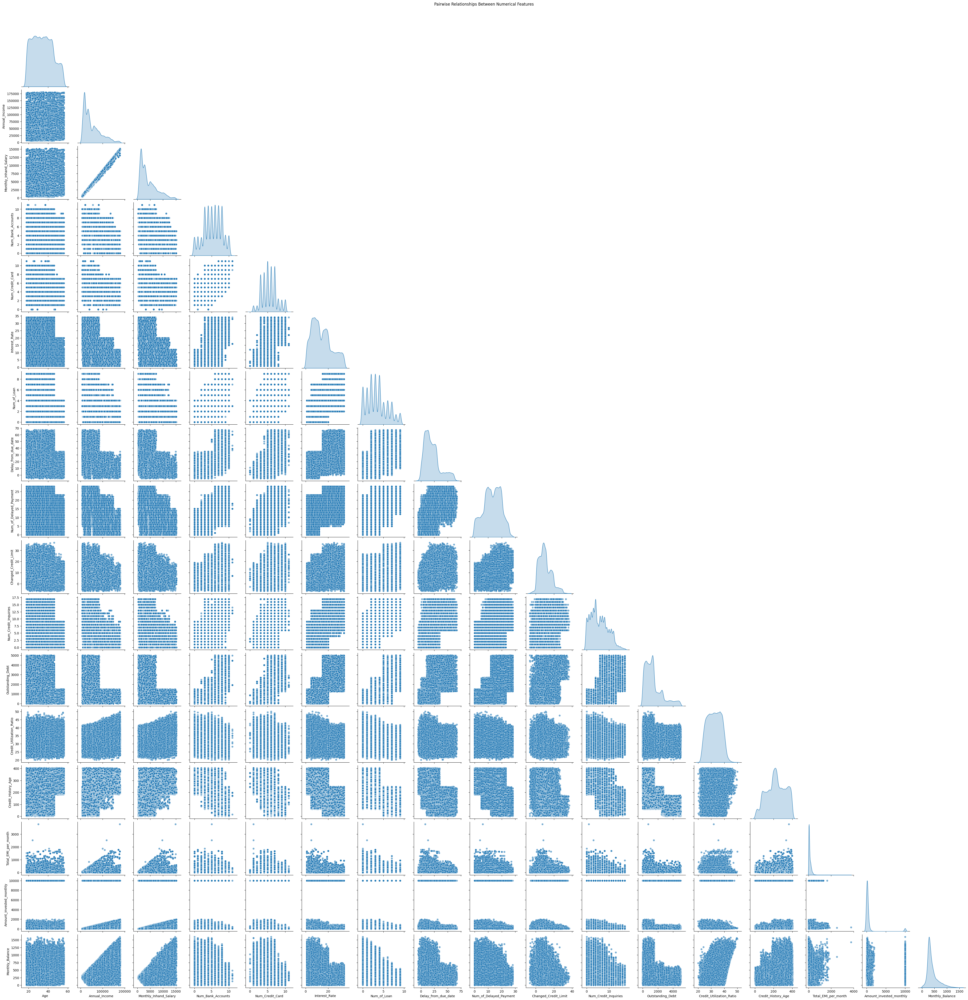

In [10]:
# Feature-Feature Analysis

sns.pairplot(numerical_df.drop(columns=['Credit_Score']), diag_kind='kde', corner=True, plot_kws={'alpha': 0.6})
plt.suptitle('Pairwise Relationships Between Numerical Features', y=1.02)
plt.savefig('feature_feature_analysis.png', dpi=300)
plt.show()

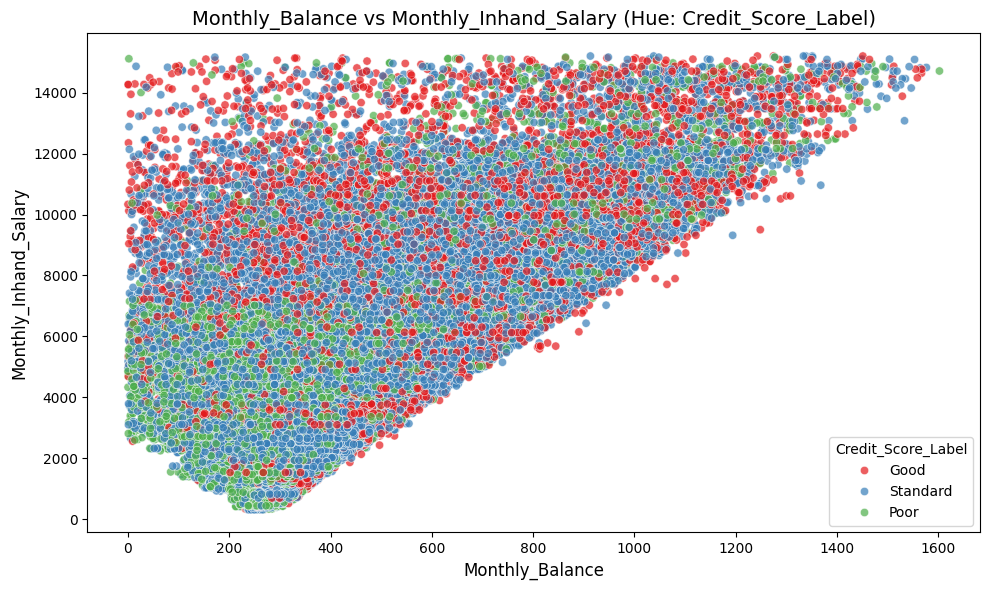

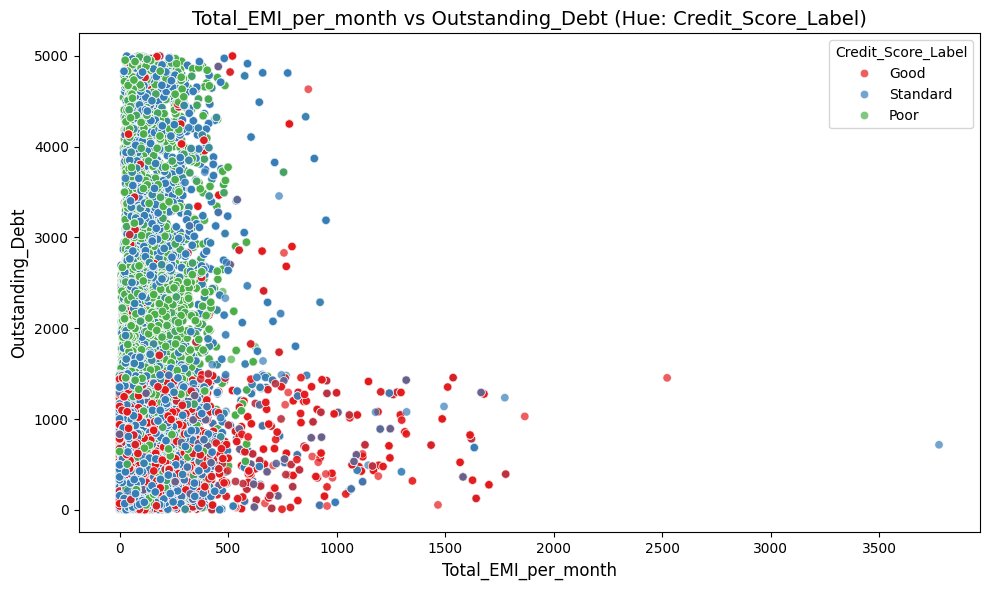

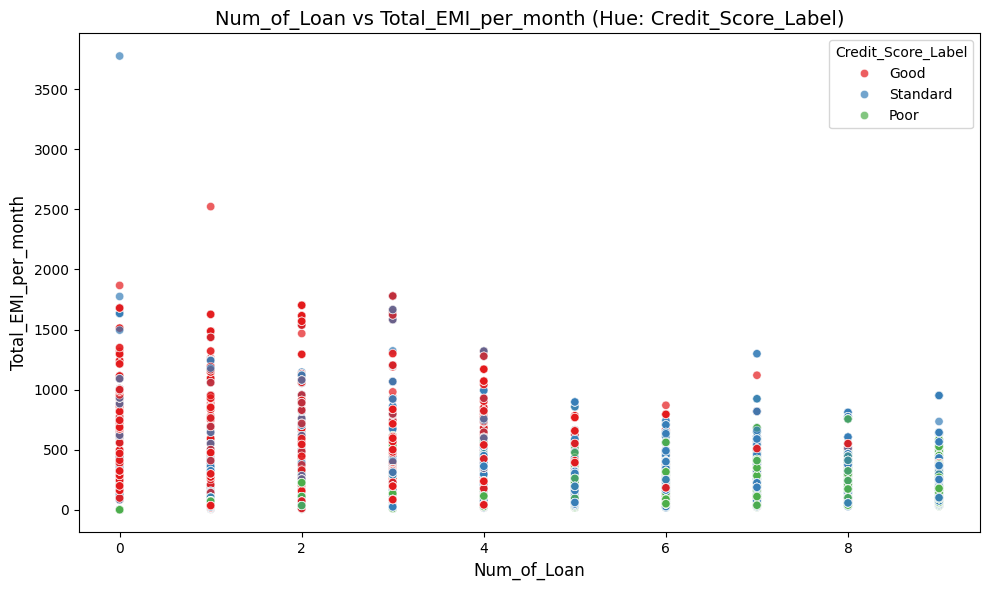

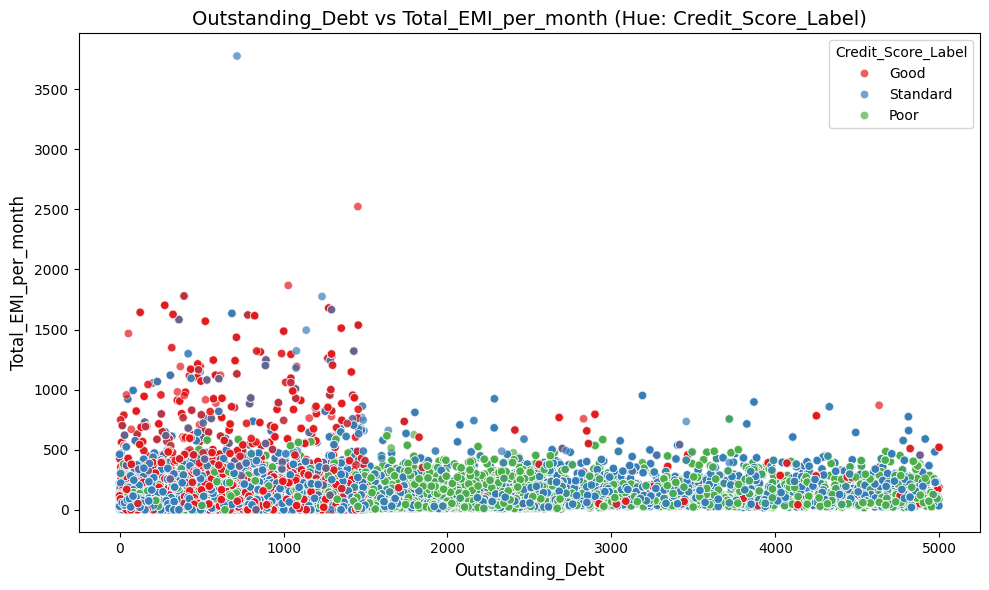

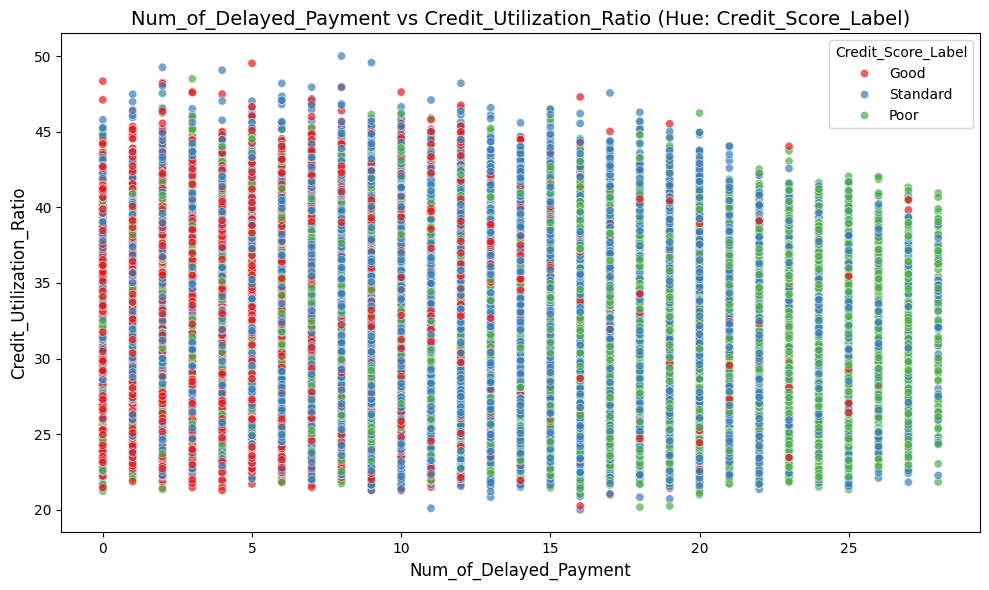

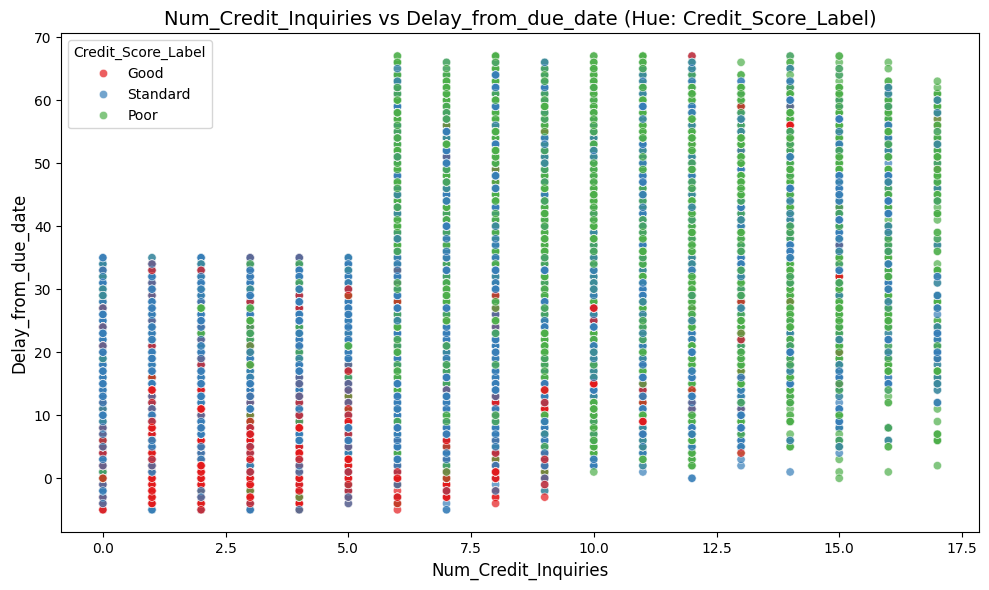

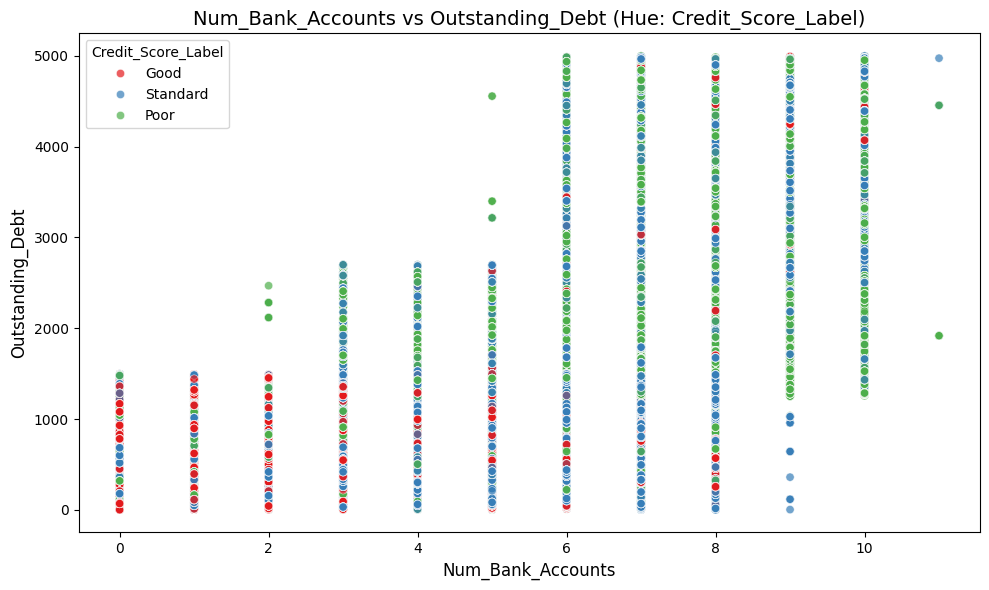

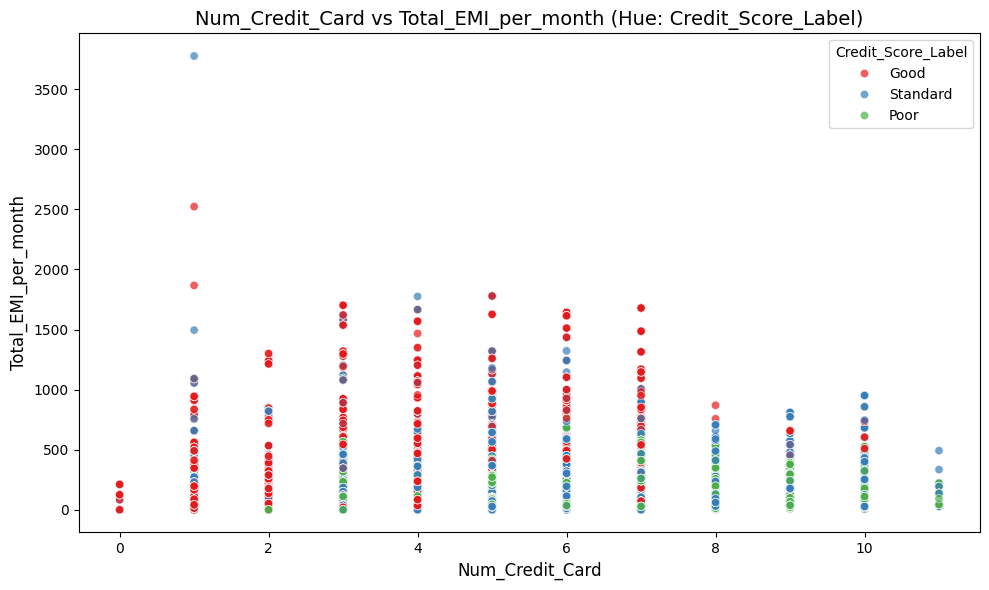

Feature relationship plots saved in the folder: feature_relationship_plots


In [11]:
# Interesting feature-feature plots analysis

# Create a folder to save the plots
output_folder = "feature_relationship_plots"
os.makedirs(output_folder, exist_ok=True)

# Strongly correlated features
strongly_correlated_features = [
    ('Monthly_Balance', 'Monthly_Inhand_Salary'),
    ('Total_EMI_per_month', 'Outstanding_Debt'),
    ('Num_of_Loan', 'Total_EMI_per_month')
]

# Interesting pairs from earlier insights
interesting_pairs = [
    ('Outstanding_Debt', 'Total_EMI_per_month'),
    ('Num_of_Delayed_Payment', 'Credit_Utilization_Ratio'),
    ('Num_Credit_Inquiries', 'Delay_from_due_date'),
    ('Num_Bank_Accounts', 'Outstanding_Debt'),
    ('Num_Credit_Card', 'Total_EMI_per_month')
]

# Combine both sets
all_relationships = strongly_correlated_features + interesting_pairs

# Plot each pair
for feature_x, feature_y in all_relationships:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=df,
        x=feature_x,
        y=feature_y,
        hue='Credit_Score_Label',
        palette='Set1',  # Use distinct colors for Credit_Score_Label
        alpha=0.7
    )
    plt.title(f'{feature_x} vs {feature_y} (Hue: Credit_Score_Label)', fontsize=14)
    plt.xlabel(feature_x, fontsize=12)
    plt.ylabel(feature_y, fontsize=12)
    plt.legend(title='Credit_Score_Label', fontsize=10)
    plt.tight_layout()
    
    # Save the plot
    plot_path = os.path.join(output_folder, f'{feature_x}_vs_{feature_y}.png')
    plt.savefig(plot_path, dpi=300)
    plt.show()
    plt.close()

print(f"Feature relationship plots saved in the folder: {output_folder}")


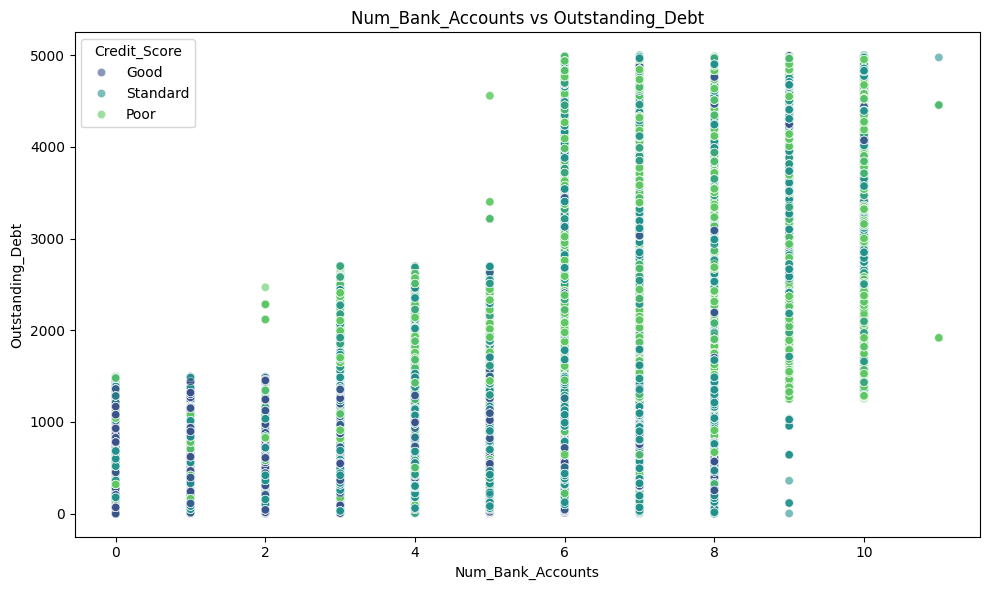

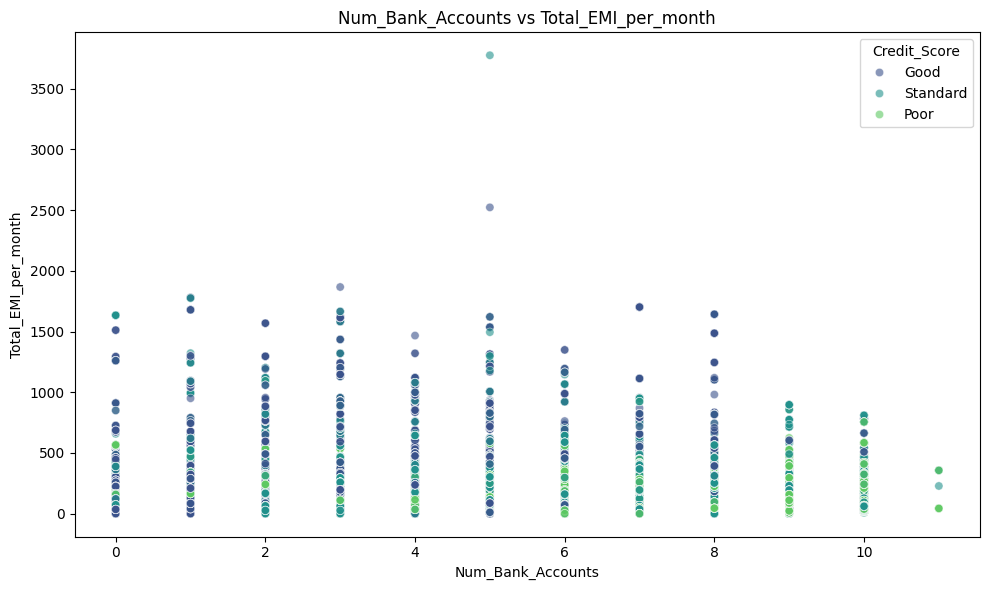

/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/857073240.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Credit_Score_Label', y=feature, palette='viridis')


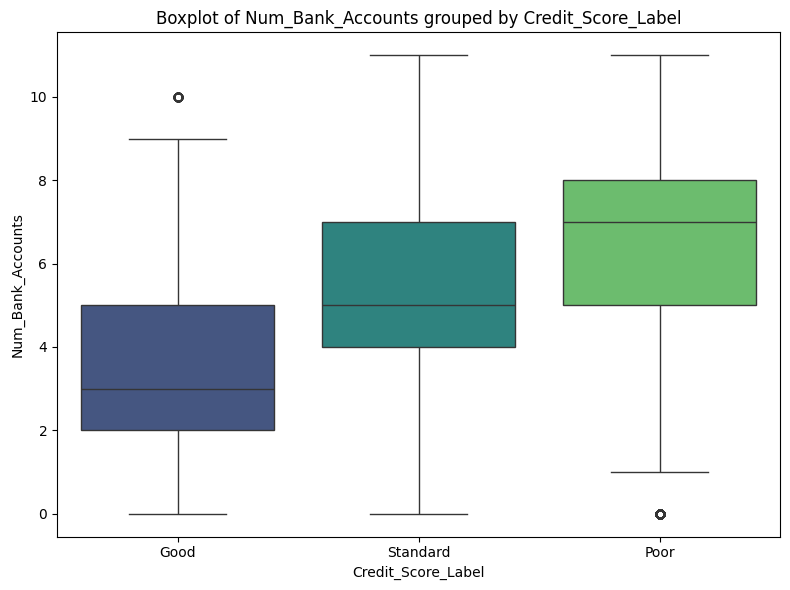

Statistical Summary of Num_Bank_Accounts:
count    94123.000000
mean         5.282407
std          2.602250
min          0.000000
25%          3.000000
50%          5.000000
75%          7.000000
max         11.000000
Name: Num_Bank_Accounts, dtype: float64


99th Percentile of Num_Bank_Accounts: 10.0
--------------------------------------------------


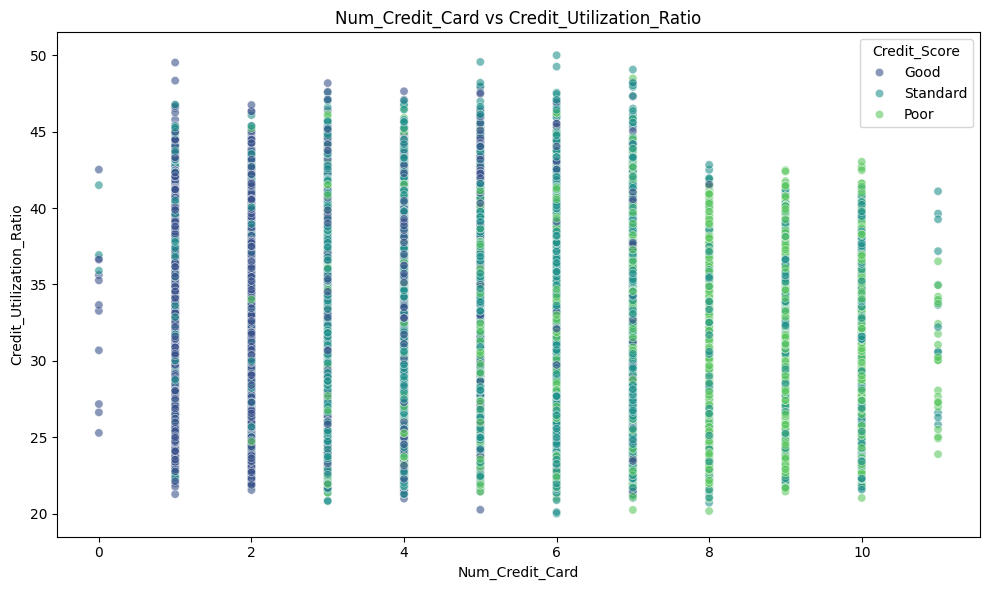

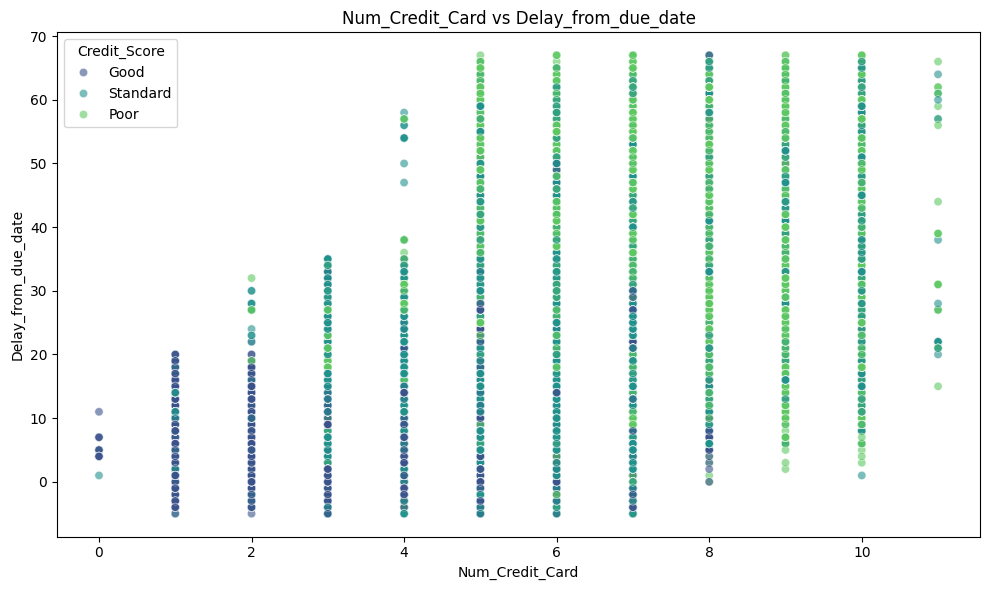

/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/857073240.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Credit_Score_Label', y=feature, palette='viridis')


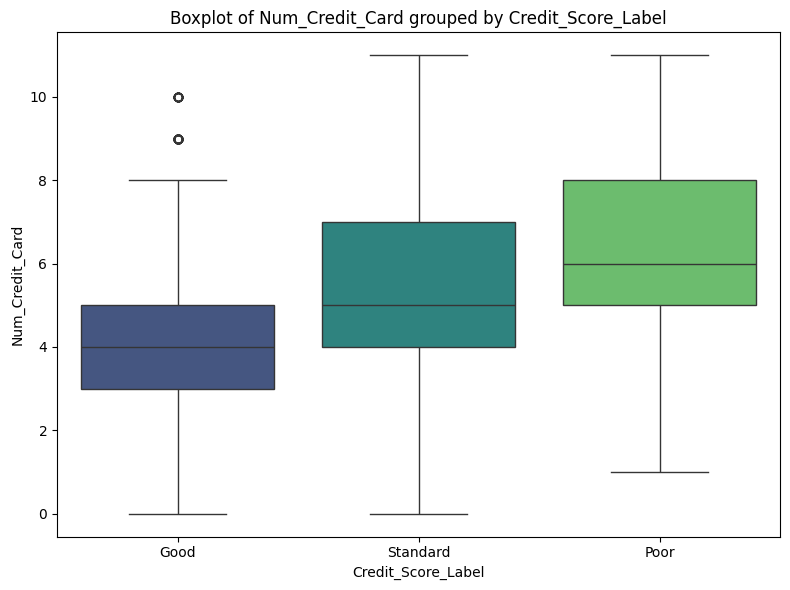

Statistical Summary of Num_Credit_Card:
count    94123.000000
mean         5.478523
std          2.054767
min          0.000000
25%          4.000000
50%          5.000000
75%          7.000000
max         11.000000
Name: Num_Credit_Card, dtype: float64


99th Percentile of Num_Credit_Card: 10.0
--------------------------------------------------


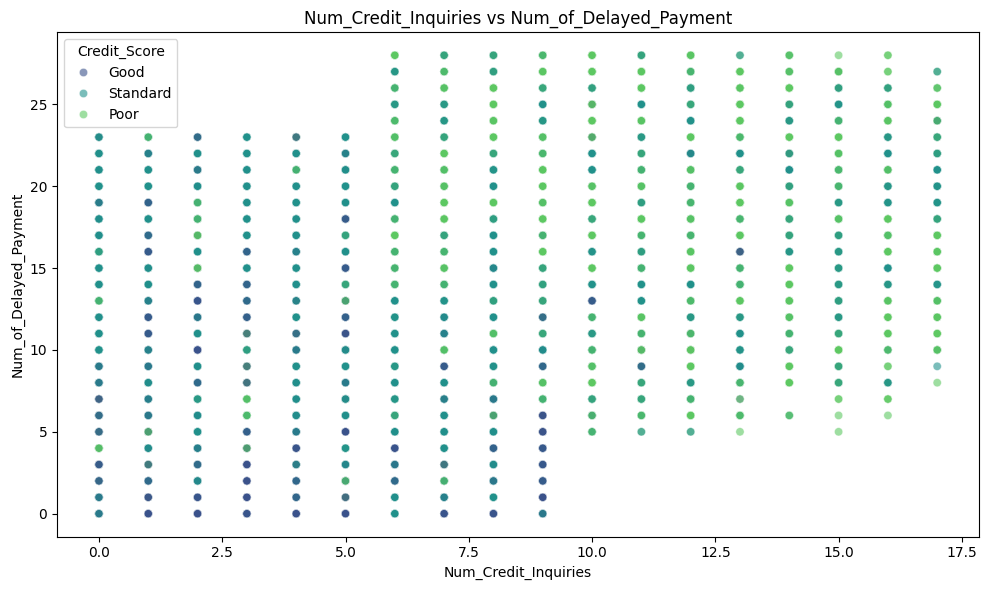

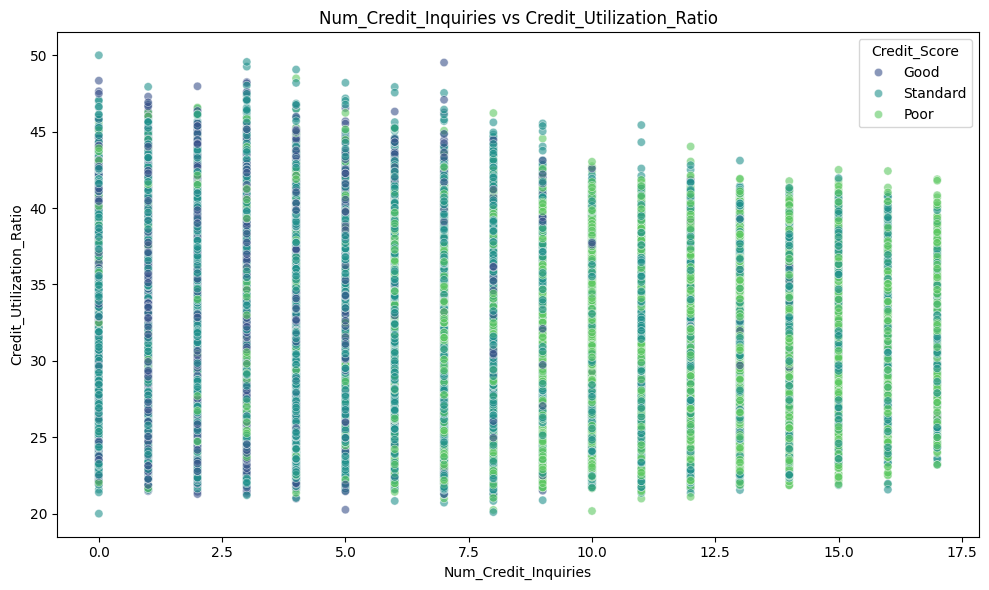

/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/857073240.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Credit_Score_Label', y=feature, palette='viridis')


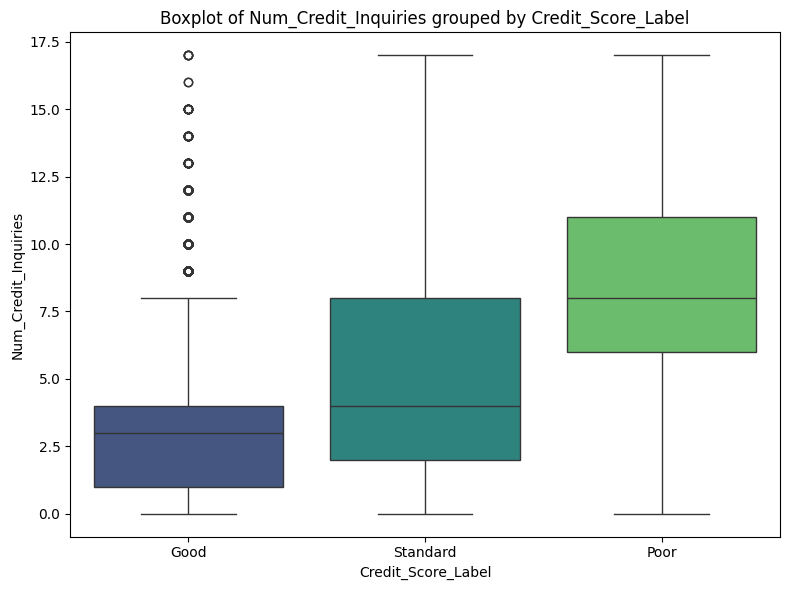

Statistical Summary of Num_Credit_Inquiries:
count    94123.000000
mean         5.588740
std          3.842434
min          0.000000
25%          2.000000
50%          5.000000
75%          8.000000
max         17.000000
Name: Num_Credit_Inquiries, dtype: float64


99th Percentile of Num_Credit_Inquiries: 15.0
--------------------------------------------------


In [15]:
# Analysis for outlier handling

# Directory to save the plots
output_dir = "plots_unclear_features"
os.makedirs(output_dir, exist_ok=True)

unclear_features = ['Num_Bank_Accounts', 'Num_Credit_Card', 'Num_Credit_Inquiries']

# Analyze each unclear feature
for feature in unclear_features:
    # Pair the feature with potential correlated features for scatterplots
    if feature == 'Num_Bank_Accounts':
        correlated_features = ['Outstanding_Debt', 'Total_EMI_per_month']
    elif feature == 'Num_Credit_Card':
        correlated_features = ['Credit_Utilization_Ratio', 'Delay_from_due_date']
    elif feature == 'Num_Credit_Inquiries':
        correlated_features = ['Num_of_Delayed_Payment', 'Credit_Utilization_Ratio']
    
    for correlated_feature in correlated_features:
        # Scatterplot to analyze trends
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=feature, y=correlated_feature, hue='Credit_Score_Label', palette='viridis', alpha=0.6)
        plt.title(f'{feature} vs {correlated_feature}')
        plt.xlabel(feature)
        plt.ylabel(correlated_feature)
        plt.legend(title='Credit_Score')
        plt.tight_layout()
        plt.savefig(f"{output_dir}/{feature}_vs_{correlated_feature}_scatter.png")
        plt.show()

    # Boxplot grouped by Credit_Score_Label
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=df, x='Credit_Score_Label', y=feature, palette='viridis')
    plt.title(f'Boxplot of {feature} grouped by Credit_Score_Label')
    plt.xlabel('Credit_Score_Label')
    plt.ylabel(feature)
    plt.tight_layout()
    plt.savefig(f"{output_dir}/{feature}_boxplot.png")
    plt.show()

    # Statistical summary of the feature
    print(f"Statistical Summary of {feature}:")
    print(df[feature].describe())
    print("\n")

    # Check percentiles to decide capping thresholds
    upper_percentile = np.percentile(df[feature], 99)
    print(f"99th Percentile of {feature}: {upper_percentile}")
    print("-" * 50)


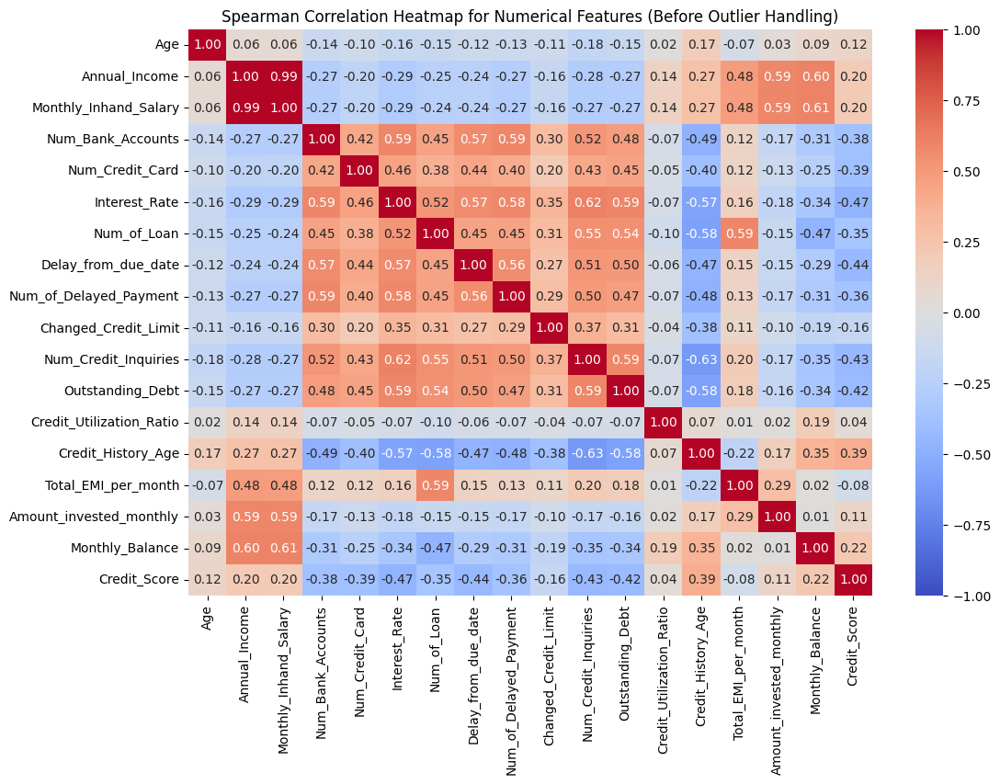

In [16]:
# Spearman correlation before outlier handling

plt.figure(figsize=(12, 8))
correlation_matrix = numerical_df.corr(method='spearman')  # Spearman correlation for ordinal relationships
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Spearman Correlation Heatmap for Numerical Features (Before Outlier Handling)')
plt.savefig("spearman_correlation_before_outliers.png")
plt.show()
plt.close()

In [17]:
# Handling outliers

# List of features to handle and their handling approach
outlier_features = {
    'Num_Bank_Accounts': 99,
    'Num_Credit_Card': 99,
    'Num_Credit_Inquiries': 99,
    'Outstanding_Debt': 99,
    'Total_EMI_per_month': 99,
    'Num_of_Delayed_Payment': 99,
    'Delay_from_due_date': 99,
    'Interest_Rate': 99
}

# Iterate over each feature and apply outlier handling
for feature, percentile in outlier_features.items():
    # Calculate the upper percentile threshold
    upper_cap = np.percentile(df[feature], percentile)
    
    # Cap values above the percentile
    df[feature] = np.where(df[feature] > upper_cap, upper_cap, df[feature])
    
    # Print updated statistics for confirmation
    print(f"Feature '{feature}' updated:")
    print(df[feature].describe())
    print("-" * 50)

Feature 'Num_Bank_Accounts' updated:
count    94123.000000
mean         5.282311
std          2.602058
min          0.000000
25%          3.000000
50%          5.000000
75%          7.000000
max         10.000000
Name: Num_Bank_Accounts, dtype: float64
--------------------------------------------------
Feature 'Num_Credit_Card' updated:
count    94123.000000
mean         5.478140
std          2.053832
min          0.000000
25%          4.000000
50%          5.000000
75%          7.000000
max         10.000000
Name: Num_Credit_Card, dtype: float64
--------------------------------------------------
Feature 'Num_Credit_Inquiries' updated:
count    94123.000000
mean         5.578785
std          3.815930
min          0.000000
25%          2.000000
50%          5.000000
75%          8.000000
max         15.000000
Name: Num_Credit_Inquiries, dtype: float64
--------------------------------------------------
Feature 'Outstanding_Debt' updated:
count    94123.000000
mean      1385.480871
std   

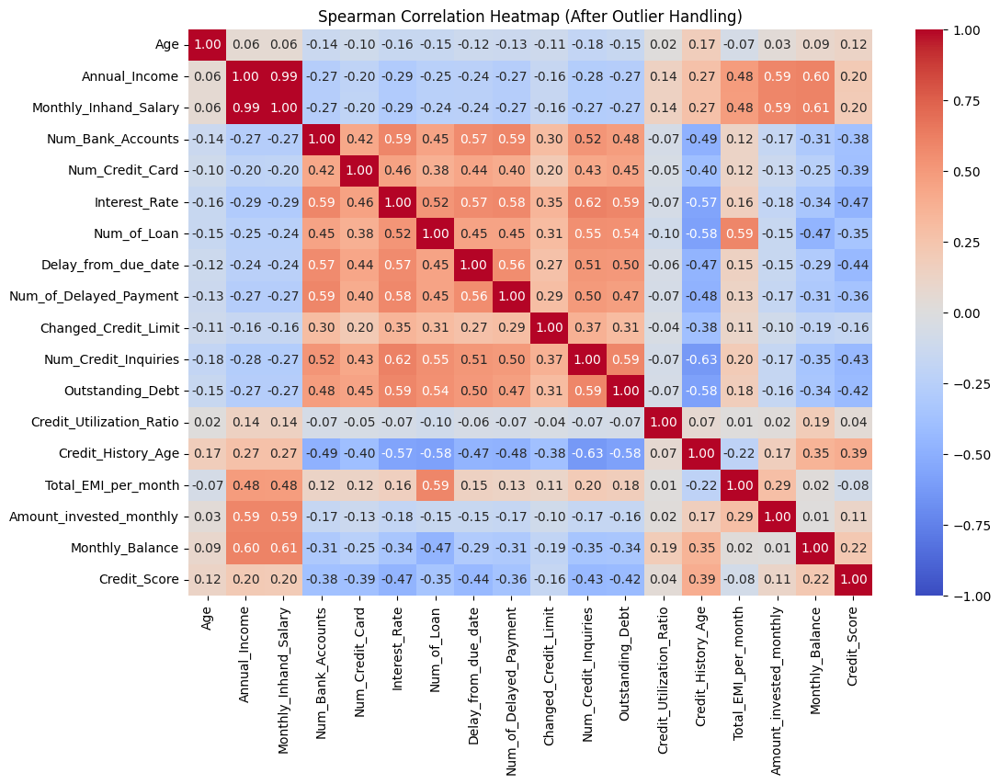

In [18]:
# Compute Spearman correlation after outlier handling
correlation_after = numerical_df.corr(method='spearman')

# Generate Spearman correlation heatmap after outlier handling
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_after, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Spearman Correlation Heatmap (After Outlier Handling)')
plt.savefig("spearman_correlation_after_outliers_numerical.png")
plt.show()
plt.close()

In [19]:
df.to_csv("credit_ds.csv", index=False)

In [20]:
df = pd.read_csv("credit_ds.csv", low_memory=False)

In [21]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Credit_Score_Label
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",3.0,7.0,11.27,4.0,Good,809.98,26.822620,265,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,2,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",-1.0,7.0,11.27,4.0,Good,809.98,31.944960,266,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,2,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",3.0,7.0,11.27,4.0,Good,809.98,28.609352,267,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,2,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",5.0,4.0,6.27,4.0,Good,809.98,31.377862,268,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,2,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",6.0,4.0,11.27,4.0,Good,809.98,24.797347,269,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,2,Good


In [13]:
df.shape

(94123, 29)

/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/2846575437.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Kruskal_Statistic', y='Feature', data=kruskal_df, palette='viridis', orient='h')


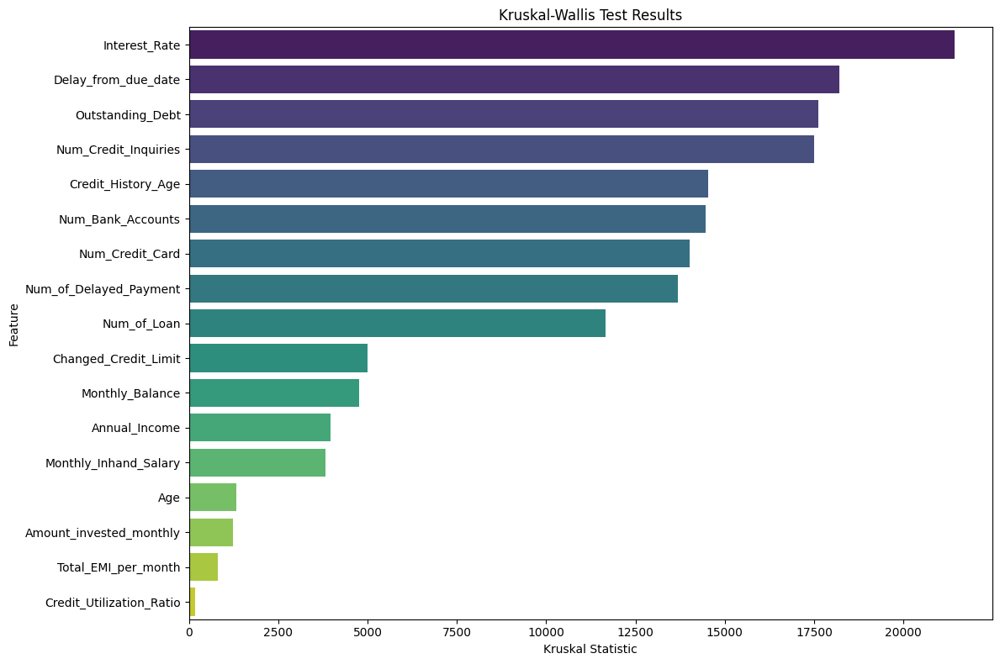


Significant Features (P-Value < 0.05):
                     Feature  Kruskal_Statistic        P_Value
5              Interest_Rate       21423.107165   0.000000e+00
7        Delay_from_due_date       18215.237633   0.000000e+00
11          Outstanding_Debt       17631.541982   0.000000e+00
10      Num_Credit_Inquiries       17509.607704   0.000000e+00
13        Credit_History_Age       14538.972984   0.000000e+00
3          Num_Bank_Accounts       14455.197419   0.000000e+00
4            Num_Credit_Card       14011.400449   0.000000e+00
8     Num_of_Delayed_Payment       13677.970235   0.000000e+00
6                Num_of_Loan       11654.426242   0.000000e+00
9       Changed_Credit_Limit        5003.323759   0.000000e+00
16           Monthly_Balance        4753.976883   0.000000e+00
1              Annual_Income        3961.643816   0.000000e+00
2      Monthly_Inhand_Salary        3814.634499   0.000000e+00
0                        Age        1318.660538  4.534219e-287
15   Amount_inv

In [22]:
# List of numerical features for the Kruskal-Wallis test
numerical_features = [
    'Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 
    'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 
    'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 
    'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age', 
    'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'
]

# Target feature (ordinal Credit_Score)
target = 'Credit_Score'  # Assuming Credit_Score is already ordinal (2, 1, 0)

# Encode Credit_Score if it's a string
if df[target].dtype == 'object':
    df[target] = df[target].astype('category').cat.codes

# Perform the Kruskal-Wallis test
kruskal_results = []
for feature in numerical_features:
    groups = [df[feature][df[target] == label].dropna() for label in df[target].unique()]
    stat, p_value = kruskal(*groups)
    kruskal_results.append({'Feature': feature, 'Kruskal_Statistic': stat, 'P_Value': p_value})

# Convert results to a DataFrame
kruskal_df = pd.DataFrame(kruskal_results)

# Sort by Kruskal Statistic (higher statistic indicates stronger differentiation)
kruskal_df = kruskal_df.sort_values(by='Kruskal_Statistic', ascending=False)

# Save Kruskal results to a CSV file
kruskal_df.to_csv("kruskal_results_sorted.csv", index=False)

# Visualization of Kruskal-Wallis test results
plt.figure(figsize=(12, 8))
sns.barplot(x='Kruskal_Statistic', y='Feature', data=kruskal_df, palette='viridis', orient='h')

plt.title("Kruskal-Wallis Test Results")
plt.xlabel("Kruskal Statistic")
plt.ylabel("Feature")
plt.tight_layout()
plt.savefig("kruskal_wallis_results_sorted.png")
plt.show()

# Identify significant features (P-Value < 0.05)
significant_features = kruskal_df[kruskal_df['P_Value'] < 0.05]
print("\nSignificant Features (P-Value < 0.05):")
print(significant_features)

In [25]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Credit_Score_Label
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",3.0,7.0,11.27,4.0,Good,809.98,26.822620,265,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,2,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",-1.0,7.0,11.27,4.0,Good,809.98,31.944960,266,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,2,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",3.0,7.0,11.27,4.0,Good,809.98,28.609352,267,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,2,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",5.0,4.0,6.27,4.0,Good,809.98,31.377862,268,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,2,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"['Auto Loan', 'Credit-Builder Loan', 'Personal...",6.0,4.0,11.27,4.0,Good,809.98,24.797347,269,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,2,Good


In [23]:
high_priority_features = [
    'Interest_Rate', 'Delay_from_due_date', 'Outstanding_Debt',
    'Num_Credit_Inquiries', 'Credit_History_Age'
]
medium_priority_features = [
    'Num_Bank_Accounts', 'Num_Credit_Card', 'Num_of_Delayed_Payment',
    'Num_of_Loan', 'Changed_Credit_Limit', 'Monthly_Balance', 'Annual_Income'
]

final_numerical_features = high_priority_features + medium_priority_features

In [24]:
columns_to_drop = ['ID', 'Customer_ID', 'Name', 'SSN']

# Drop the columns
df = df.drop(columns=columns_to_drop, errors='ignore')

In [25]:
categorical_features = df.select_dtypes(include='object').columns.tolist()

/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1888485002.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=target, order=class_counts.index, palette='viridis')


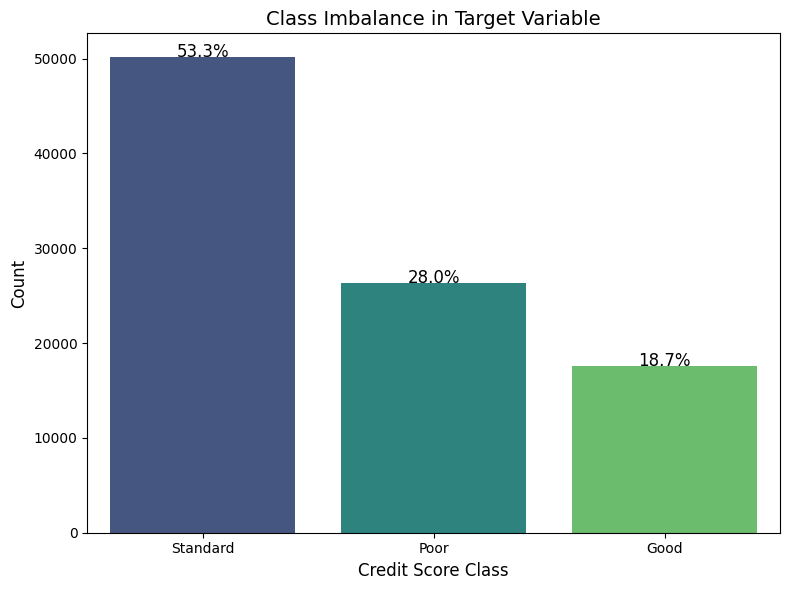

In [26]:
# Target variable
target = 'Credit_Score_Label'

# Calculate class counts and percentages
class_counts = df[target].value_counts()
class_percentages = df[target].value_counts(normalize=True) * 100

# Create count plot
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x=target, order=class_counts.index, palette='viridis')

# Add percentages on top of bars
for i, count in enumerate(class_counts):
    percentage = class_percentages.iloc[i]
    plt.text(i, count + 0.5, f'{percentage:.1f}%', ha='center', fontsize=12, color='black')

# Add titles and labels
plt.title('Class Imbalance in Target Variable', fontsize=14)
plt.xlabel('Credit Score Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.tight_layout()
plt.savefig("class_imbalance_plot.png", dpi=300)
plt.show()
plt.close()

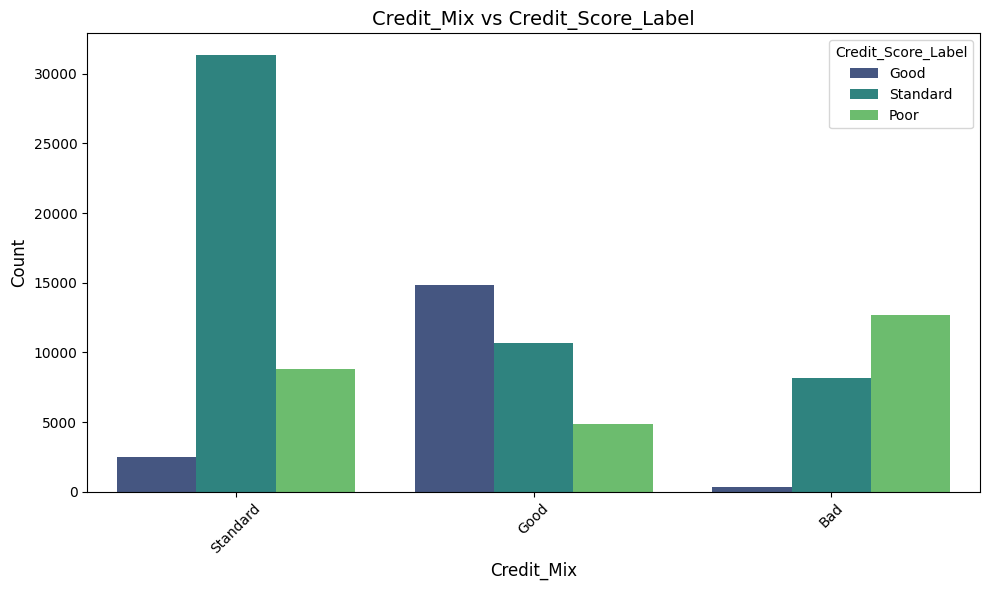

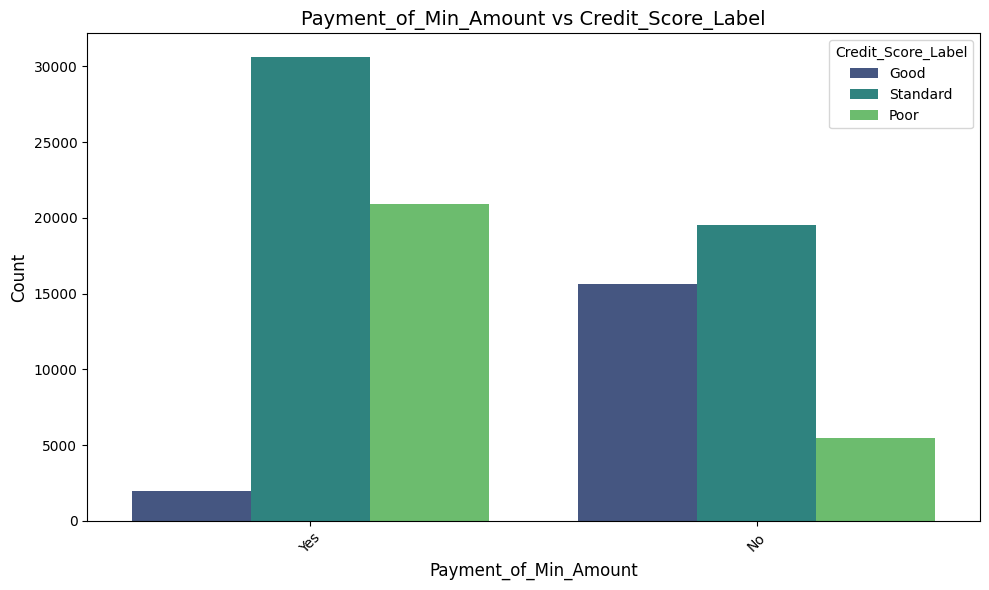

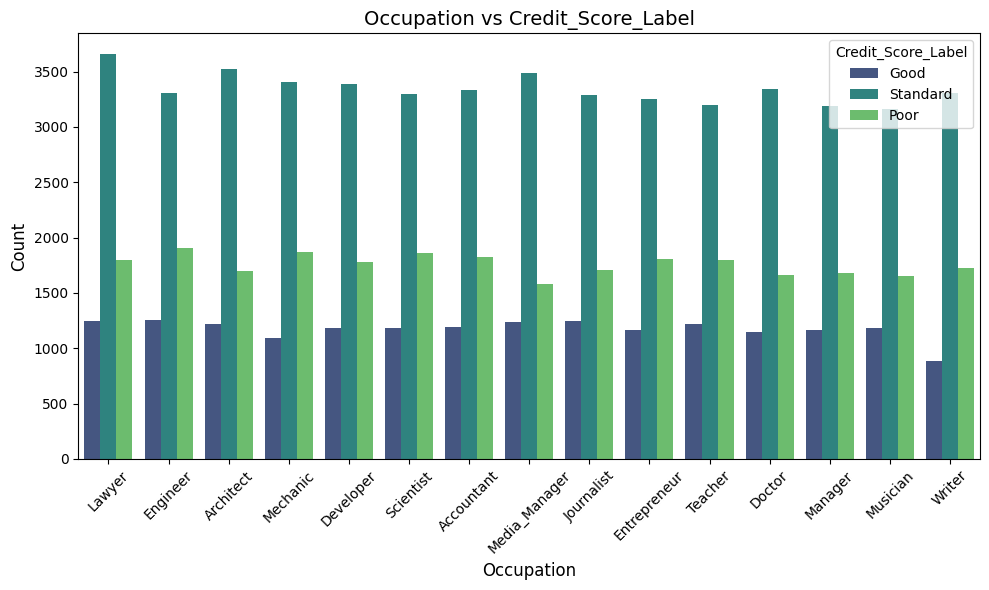

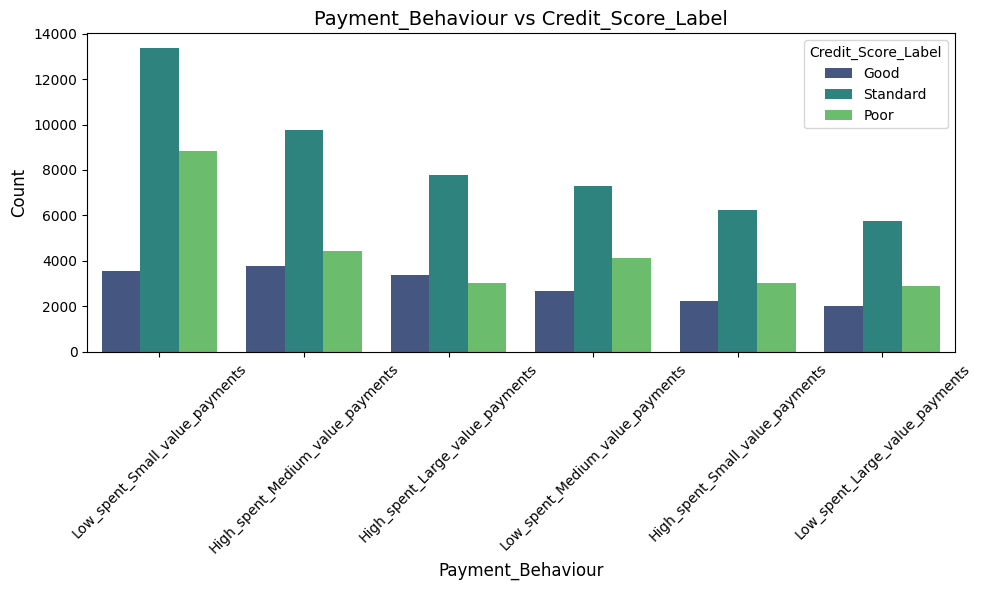

In [30]:

# Create a directory to save the plots
output_dir = "categorical_vs_target_plots"
os.makedirs(output_dir, exist_ok=True)

def plot_categorical_vs_target(feature, df, target):
    plt.figure(figsize=(10, 6))
    
    # Create the count plot
    ax = sns.countplot(data=df, x=feature, hue=target, palette='viridis', order=df[feature].value_counts().index)
    
    # # Calculate percentages
    # grouped = df.groupby([feature, target]).size().unstack(fill_value=0)
    # percentages = (grouped / grouped.sum(axis=1).values.reshape(-1, 1)) * 100
    
    # # Annotate the bars with the correct percentage values
    # for container, hue_level in zip(ax.containers, percentages.columns):
    #     for bar, percentage in zip(container, percentages[hue_level]):
    #         height = bar.get_height()
    #         if height > 0:
    #             ax.text(
    #                 bar.get_x() + bar.get_width() / 2,
    #                 height,
    #                 f"{percentage:.1f}%",
    #                 ha="center",
    #                 va="bottom",
    #                 fontsize=9,
    #                 color="black",
    #             )
    
    # Add labels and title
    plt.title(f'{feature} vs {target}', fontsize=14)
    plt.xlabel(feature, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Save the plot as a high-quality image
    output_path = os.path.join(output_dir, f"{feature}_vs_{target}.png")
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# List of categorical features and target
categorical_features = ['Credit_Mix', 'Payment_of_Min_Amount', 'Occupation', 'Payment_Behaviour']
target = 'Credit_Score_Label'

# Plot each categorical feature
for feature in categorical_features:
    plot_categorical_vs_target(feature, df, target)


Significant Features Based on Chi-Squared Test:
                       Chi-Square Statistic        P-Value
Credit_Mix                     38021.382753   0.000000e+00
Payment_of_Min_Amount          20682.171367   0.000000e+00
Payment_Behaviour               1314.125085  3.421582e-276
Month                            173.341906   1.445303e-29
Occupation                       157.453625   5.518412e-20


/var/folders/jq/hnmg04c105bgc7fnqsfpy02r0000gn/T/ipykernel_21392/1708812420.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


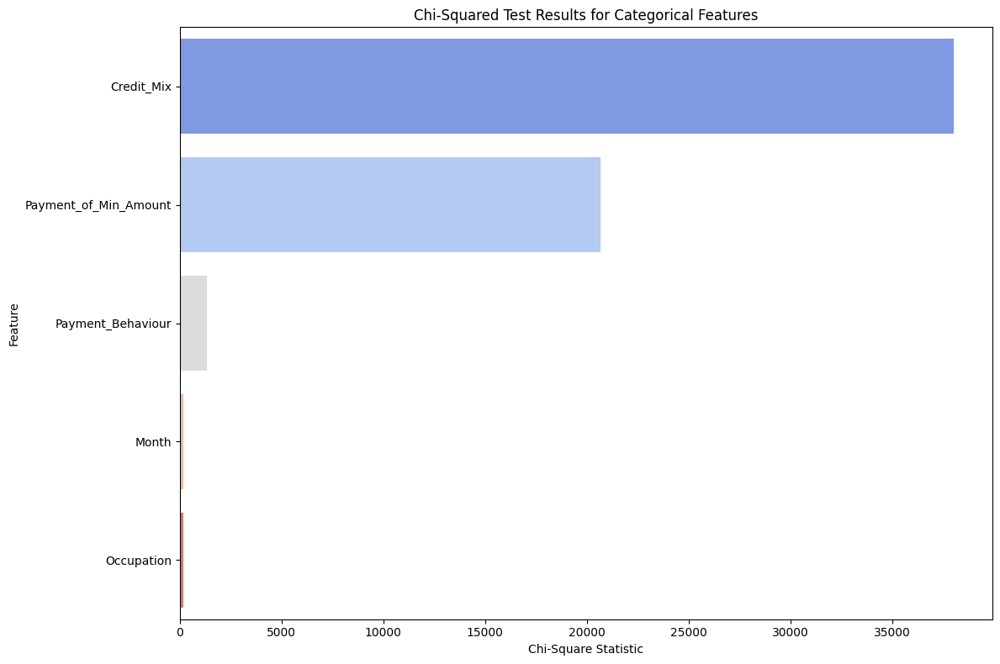

In [27]:
from scipy.stats import chi2_contingency
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Automatically identifying categorical features
categorical_features = df.select_dtypes(include='object').columns.tolist()
categorical_features.remove('Type_of_Loan')  # Exclude 'Type_of_Loan'

target = 'Credit_Score_Label'  # Categorical target variable

# Perform Chi-Squared test
chi2_results = {}
for feature in categorical_features:
    if feature != target:  # Ensure the target variable itself is not tested
        contingency_table = pd.crosstab(df[feature], df[target])
        stat, p_value, dof, expected = chi2_contingency(contingency_table)
        chi2_results[feature] = {'Chi-Square Statistic': stat, 'P-Value': p_value}

# Convert results to DataFrame
chi2_df = pd.DataFrame(chi2_results).T
chi2_df = chi2_df.sort_values(by='Chi-Square Statistic', ascending=False)

# Identify significant features
significant_features = chi2_df[chi2_df['P-Value'] < 0.05]
print("Significant Features Based on Chi-Squared Test:")
print(significant_features)

# Plot Chi-Squared results with gradient
plt.figure(figsize=(12, 8))
sns.barplot(
    data=chi2_df.reset_index(),
    x='Chi-Square Statistic',
    y='index',
    palette=sns.color_palette("coolwarm", len(chi2_df))
)
plt.xlabel('Chi-Square Statistic')
plt.ylabel('Feature')
plt.title('Chi-Squared Test Results for Categorical Features')
plt.tight_layout()

# Save the plot
plt.savefig('chi_squared_test_results_with_gradient.png', dpi=300)
plt.show()
plt.close()

In [28]:
# Extracting the final features

final_features = high_priority_features + medium_priority_features  # Target
top_categorical_features = chi2_df.head(3).index.tolist() + ["Type_of_Loan"]
final_features.extend(top_categorical_features)
final_features.append("Credit_Score")

# Filter the dataset
final_dataset = df[final_features]

In [29]:
final_dataset.shape

(94123, 17)

In [30]:
final_dataset.to_csv("credit_modeling_dataset.csv", index=False)